### preambule

In [1]:
## importing stuff
import os
import pickle
from sys import path as syspath
syspath.append(os.path.expanduser("~/srdjan_functs/"))
import javabridge
from bioformats import JARS as bfJARS
javabridge.start_vm(class_path=bfJARS, max_heap_size="20G")
import numpy as np
import matplotlib.pyplot as plt

%config InlineBackend.figure_format = 'retina'
%load_ext autoreload
%autoreload 2
# %aimport islets

from IPython.display import display
import pandas as pd

from islets.Recording import Recording, saveMovie
from islets.numeric import power_spectrum, rebin
from islets.utils import show_movie, saveRois
# from islets.Regions1 import getPeak2BoundaryDF, getGraph_of_ROIs_to_Merge, mergeBasedOnGraph

from caiman import movie as cmovie

from matplotlib.colors import LogNorm

import tifffile

from islets.Regions  import Regions as Regions0
from islets.Regions1 import Regions as Regions1

/opt/tljh/user/envs/physio/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.decomposition.incremental_pca module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.decomposition. Anything that cannot be imported from sklearn.decomposition is now part of the private API.
  warnings.warn(message, FutureWarning)


In [2]:
folder = "/data/Sandra/2020/2020_09_21/REC_5_10_min_20Hz_1mM_Ca/"

In [3]:
pathtotifs = [folder+f for f in sorted(os.listdir(folder)) if f.endswith("tif")]

In [4]:
data = tifffile.imread(pathtotifs[0])

In [5]:
freq = 20

In [6]:
movie = cmovie(data, fr=freq)

In [7]:
movie.shape

(12000, 1024, 1024)

In [12]:
exp = os.path.split(folder[:-1])[-1]

In [13]:
saveMovie(
    movie.resize(1/2,1/2,1),
    folder+exp+".mp4"
)

0

In [14]:
# show_movie(movie.resize(1/4,1/4,1),figScale=2,log=True)

In [10]:
from islets.numeric import get_sep_th
from general_functions import autocorr2d
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from islets.Regions1 import getStatImages

In [11]:
statImages = getStatImages(movie[::])

In [12]:
tpcx = autocorr2d(statImages["std"],np.arange(0,20),[0]).flatten()
tpcy = autocorr2d(statImages["std"],[0],np.arange(0,20)).flatten()
x = (tpcx+tpcy)/2
cellSizePx = np.searchsorted(-x,-.1,)
print (f"Assuming the cells are approx {cellSizePx} pixels in radius")

Assuming the cells are approx 10 pixels in radius


In [30]:
from islets.numeric import robust_max

In [69]:
im = statImages["mean"].copy()[:, :]
n = 4
im = rebin(im,n)
im = rebin(im,n,1)
im = im[:]
im = im - im.min()
im = im/robust_max(im)
fs = np.ceil(cellSizePx/n)
if fs>1:
    fs = int(fs)
else:
    fs=None


In [70]:
im.shape, fs

((256, 256), 3)

<IPython.core.display.Javascript object>


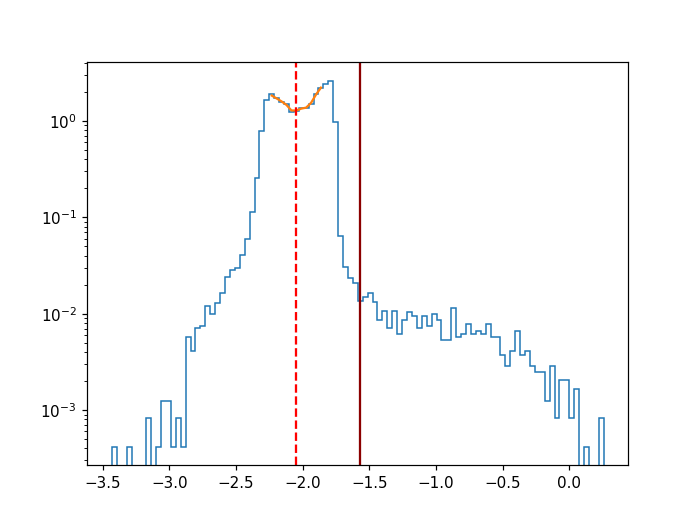

In [72]:
th = get_sep_th(im.flat, plot=True,log=True)
plt.yscale("log")
th = th*3
plt.axvline(np.log10(th),color="darkred")

In [73]:
regions = Regions1(im, gSig_filt=fs,img_th=th, mode="custom", verbose=True)

Initiating from an image, with a mode custom
dilating valid pixels by 3
initiating the cralwing dict with 64363 pixels excluded.
entering crawling dict with 64363 pixels excluded.
Crawling the image with 64363 pixels excluded.


In [74]:
regions.plotEdges()

/home/jupyter-srdjan/srdjan_functs/islets/Regions1.py:325: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.

/home/jupyter-srdjan/srdjan_functs/islets/Regions1.py:330: UserWarning:

Attempted to set non-positive top ylim on a log-scaled axis.
Invalid limit will be ignored.



In [75]:
regions.reassign_peaks(regions.statImages[regions.mode])

In [76]:
from ipywidgets import interactive

In [77]:
import ipywidgets as widgets

In [78]:
image = regions.statImages[regions.mode]

In [79]:
%%capture
logTh = np.log10(get_sep_th(image.flat,log=True))
logTh = np.round(logTh,2)

In [80]:
%matplotlib notebook

interactive(children=(FloatSlider(value=-2.0, description='logth', max=0.0, min=-2.0, step=0.01), Output(layou…

<IPython.core.display.Javascript object>


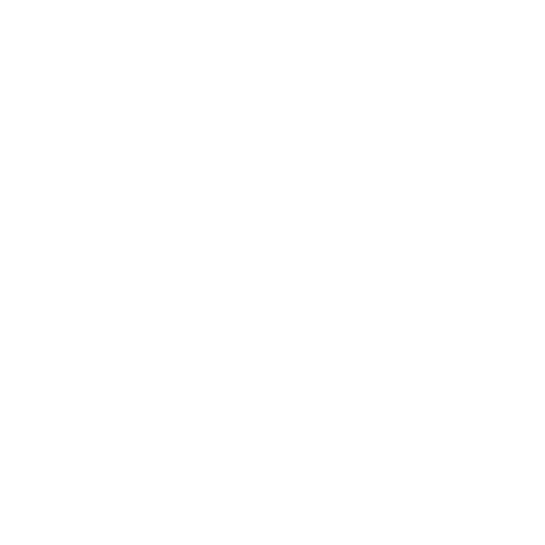

In [81]:
def f(logth):
    axline.set_data([logth]*2,[0,1])
    for i in range(len(lines)):
        lines[i].set_color("r" if np.log10(regions.df.peakValue.iloc[i])<logth else "b")
interactive_plot = interactive(f, logth = widgets.FloatSlider(min=-2,max=0,value=logTh, step = .01))
output = interactive_plot.children[-1]
output.layout.height = '10px'
output.layout.width = '400px'

display(interactive_plot)

# plt.ion()
# fig, ax = plt.subplots(1,1,figsize=(6,6))
fig = plt.figure(figsize=(5,5))
ax = fig.add_axes([0,0,1,1])

ax.imshow(image, cmap="Greys", norm=LogNorm())
regions.plotEdges(ax=ax, color="C0", image=False, separate=True)
lines = ax.lines
axin = inset_axes(ax, width="90%", height="90%", loc=4,  bbox_to_anchor=(.01, .7, .4, .3),
                      bbox_transform=ax.transAxes,
                     )
# axin.hist(np.log10(image+np.percentile(image,1)).flatten(),100,histtype="step", color="k")
# y,x = np.histogram(np.log10(image+np.percentile(image,1)).flatten(),100)
# x = (x[:-1]+x[1:])/2
# axin.fill_between(x,y, color="navy")
axin.hist(np.log10(regions.df.peakValue),100)
axin.patch.set_alpha( 0.1)
for sp in ["top","left","right"]: axin.spines[sp].set_visible(False)
axin.set_yticks([])
axin.set_ylim(0,)
axline = axin.axvline(logTh,color="r",lw=.7)

In [82]:
regions.update(movie.resize(1/n,1/n,1))

In [83]:
# regions.detrend_traces(fast=False)

In [86]:
regions.examine3(max_rois=len(regions.df))

In [87]:
saveRois(regions, folder, filename="srdjan_handcurated", formats=["vienna"])

['ROI info saved in /data/Sandra/2020/2020_09_21/REC_5_10_min_20Hz_1mM_Ca//2020_09_23_srdjan_handcurated_rois.pkl.']

### Blind alleys

In [7]:
from caiman import load as cload

In [13]:
# a = cload(pathtotifs[0],outtype="uint16");

In [47]:
del a

In [51]:
# import gc

In [50]:
# gc.collect()

In [52]:
%%time
metadata = []
for path in pathtotifs:
    with tifffile.TiffFile(path) as tif:
        metadata += [ (path, len(tif.pages),)+tif.pages[0].shape +(tif.pages[0].dtype, )]
    

CPU times: user 72.1 ms, sys: 31.2 ms, total: 103 ms
Wall time: 103 ms


In [53]:
metadata = pd.DataFrame(metadata, columns=["series","T","X","Y","dtype"])
metadata = metadata.set_index("series")
assert len(metadata.dtype.unique())==1
assert len(metadata.X.unique())==1
assert len(metadata.Y.unique())==1

shape = (metadata['T'].sum(), metadata['X'].iloc[0], metadata['Y'].iloc[0])
dtype = metadata.dtype.iloc[0]

In [54]:
data = np.zeros(shape=shape, dtype=dtype)

In [63]:
a = tifffile.imread(pathtotifs[-1])

In [ ]:
a.shape

In [59]:
for path in metadata.index:
    print (path, metadata.loc[path].values)
    i0 = metadata.loc[:path,"T"].iloc[:-1].sum()
    i1 = metadata.loc[:path,"T"].sum()
    part = tifffile.imread(path)
    data[i0:i1] = part
#     del part

/data/Sandra/2020/2020_09_21/REC_5_10_min_20Hz_1mM_Ca/Untitled_1_MMStack.ome.tif [2040 1024 1024 dtype('uint16')]


ValueError: could not broadcast input array from shape (12000,1024,1024) into shape (2040,1024,1024)

In [60]:
i1-i0

2040

In [62]:
part.shape

(12000, 1024, 1024)

In [64]:
mean = part.mean(0)

In [65]:
i,j = np.squeeze(np.where(mean==mean.max()))

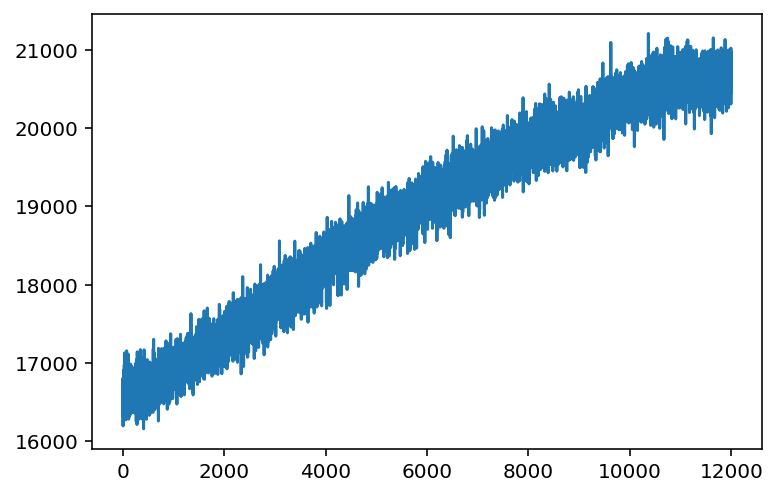

In [66]:
plt.plot(part[:,i,j])

In [ ]:
data[i0:i1]

In [46]:
tifffile.imread(path).shape

KeyboardInterrupt: 

In [ ]:
# x = []
# for i in 35000+np.arange(0,30000,1):
#     mmm = np.memmap(pathtotifs[0],mode="r", dtype="uint16", shape=shape, order="C", offset=i)
#     x += [np.abs(mmm[0]-im).mean()]
# #     x += [(mmm[0]!=im).sum()]

In [17]:
with open(pathtotifs[0], 'rb') as tif:
    ir = 0
    while True:
        chunk = tif.read(4096)
        if not chunk:
            break
        ir += 1
        if ir>10:
            break
print (ir)

11


In [19]:
chunk

'b\'\\x00\\xd6\\x07\\x00\\x00\\x00\\x00\\x00\\x00\\x01\\xfcM\\xfb\\x00\\x00\\x00\\x00\\x00\\x00\\x00\\x00\\xd7\\x07\\x00\\x00\\x00\\x00\\x00\\x00\\x11\\x0en\\xfb\\x00\\x00\\x00\\x00\\x00\\x00\\x00\\x00\\xd8\\x07\\x00\\x00\\x00\\x00\\x00\\x00! \\x8e\\xfb\\x00\\x00\\x00\\x00\\x00\\x00\\x00\\x00\\xd9\\x07\\x00\\x00\\x00\\x00\\x00\\x0012\\xae\\xfb\\x00\\x00\\x00\\x00\\x00\\x00\\x00\\x00\\xda\\x07\\x00\\x00\\x00\\x00\\x00\\x00@D\\xce\\xfb\\x00\\x00\\x00\\x00\\x00\\x00\\x00\\x00\\xdb\\x07\\x00\\x00\\x00\\x00\\x00\\x00PV\\xee\\xfb\\x00\\x00\\x00\\x00\\x00\\x00\\x00\\x00\\xdc\\x07\\x00\\x00\\x00\\x00\\x00\\x00`h\\x0e\\xfc\\x00\\x00\\x00\\x00\\x00\\x00\\x00\\x00\\xdd\\x07\\x00\\x00\\x00\\x00\\x00\\x00pz.\\xfc\\x00\\x00\\x00\\x00\\x00\\x00\\x00\\x00\\xde\\x07\\x00\\x00\\x00\\x00\\x00\\x00\\x80\\x8cN\\xfc\\x00\\x00\\x00\\x00\\x00\\x00\\x00\\x00\\xdf\\x07\\x00\\x00\\x00\\x00\\x00\\x00\\x8f\\x9en\\xfc\\x00\\x00\\x00\\x00\\x00\\x00\\x00\\x00\\xe0\\x07\\x00\\x00\\x00\\x00\\x00\\x00\\x9f\\xb0\\x8e\\xf

In [ ]:
movie = cload(pathtotifs[0], outtype="uint16")

movie.shape

In [168]:
from islets.numeric import get_sep_th

In [9]:
from general_functions import autocorr2d

In [59]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

In [10]:
from islets.Regions1 import getStatImages

In [11]:
statImages = getStatImages(movie[::3])

In [51]:
tpcx = autocorr2d(statImages["std"],np.arange(0,20),[0]).flatten()
tpcy = autocorr2d(statImages["std"],[0],np.arange(0,20)).flatten()
x = (tpcx+tpcy)/2
cellSizePx = np.searchsorted(-x,-.1,)
print (f"Assuming the cells are approx {cellSizePx} pixels in radius")

Assuming the cells are approx 10 pixels in radius


/opt/tljh/user/envs/physio/lib/python3.7/site-packages/ipykernel_launcher.py:12: RuntimeWarning:

invalid value encountered in log10

/opt/tljh/user/envs/physio/lib/python3.7/site-packages/numpy/lib/histograms.py:829: RuntimeWarning:

invalid value encountered in greater_equal

/opt/tljh/user/envs/physio/lib/python3.7/site-packages/numpy/lib/histograms.py:830: RuntimeWarning:

invalid value encountered in less_equal

/opt/tljh/user/envs/physio/lib/python3.7/site-packages/ipykernel_launcher.py:30: UserWarning:

This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.



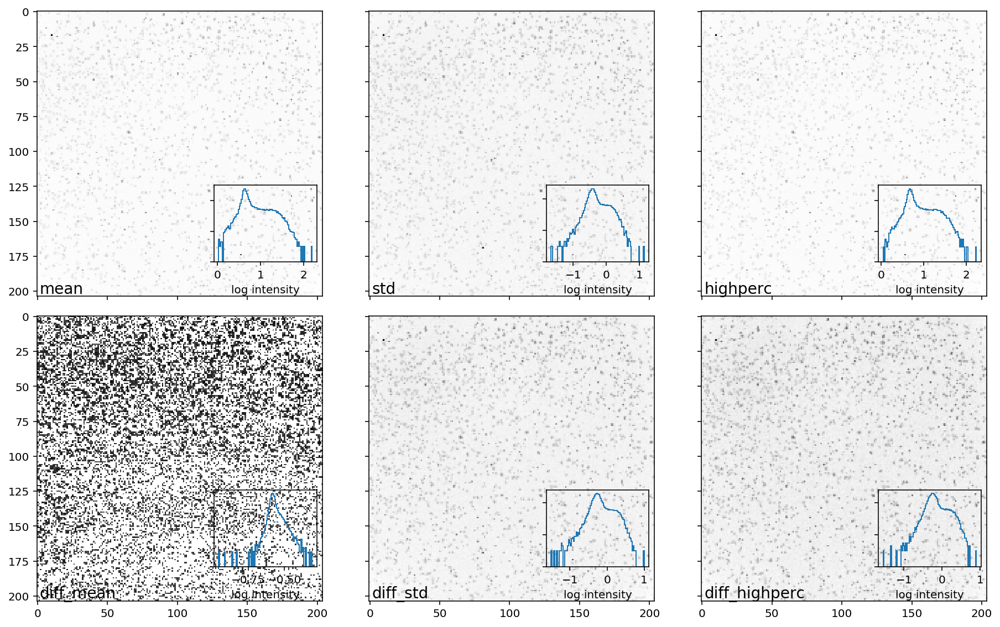

In [116]:
fig,axs = plt.subplots(2,3,figsize=(13,8), sharex=True, sharey=True)
for ax,k in zip(axs.flat,statImages):
    ax.text(.01,.01,k,transform=ax.transAxes,size=14)
    im = statImages[k]
    im = rebin(im, 10)
    im = rebin(im, 10,1)
    img = ax.imshow(im, cmap="Greys", norm=LogNorm())
    axin = inset_axes(ax, width="90%", height="90%", loc=4,  bbox_to_anchor=(.6, .1, .4, .3),
                      bbox_transform=ax.transAxes,
                     )
    axin.patch.set_alpha(0.)
    axin.hist(np.log10(im.flat-im.min()*.99),100,histtype="step",log=True)
    axin.set_xlabel("log intensity")
    axin.tick_params(labelleft=False,
#                      labelbottom=False
                    )
    
#     axin = inset_axes(ax, width="90%", height="90%", loc=4,  bbox_to_anchor=(.6, .4, .4, .05),
#                       bbox_transform=ax.transAxes,
#                      )
#     cax = plt.colorbar(img, cax=axin,
#                        orientation="horizontal",
#                        ticks=[200,300],
# #                        ticklabels=range(0,1000,100),
#                       )
#     cax.set_ticks([])
#     cax.set_ticklabels([])
#     axin.tick_params(labelbottom=False)
#     break
plt.tight_layout()

In [175]:
im = statImages["mean"].copy()[:512, :512]
n = 3
im = rebin(im,n)
im = rebin(im,n,1)
im = im - im.min()
im = im/im.max()
fs = np.ceil(cellSizePx/n)
if fs>1:
    fs = int(fs)
else:
    fs=None


In [176]:
im.shape, fs

((170, 170), 4)

/home/jupyter-srdjan/srdjan_functs/islets/numeric.py:91: RuntimeWarning:

divide by zero encountered in log10



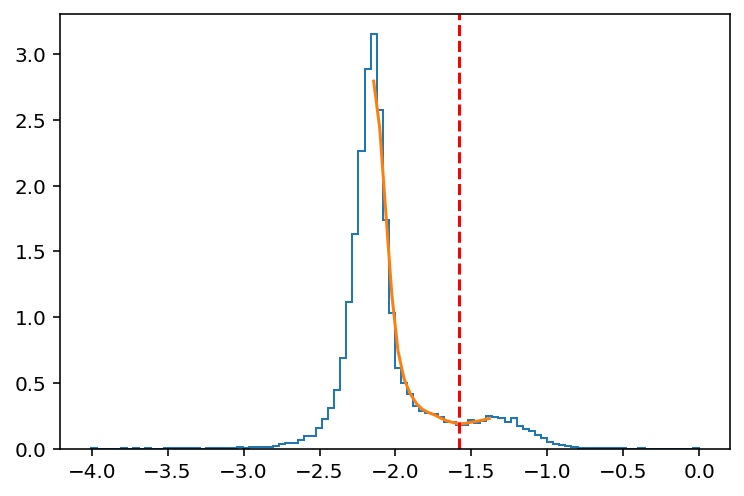

In [177]:
th = get_sep_th(im.flat, plot=True,log=True)
# plt.yscale("log")

In [242]:
regions = Regions1(im[:120], gSig_filt=fs,img_th=th, mode="custom", verbose=True)

Initiating from an image, with a mode custom
dilating valid pixels by 5
initiating the cralwing dict with 13884 pixels excluded.
entering crawling dict with 13884 pixels excluded.
Crawling the image with 13884 pixels excluded.


In [243]:
from islets.numeric import robust_max

In [244]:
regions.reassign_peaks(regions.statImages[regions.mode])

In [347]:
from ipywidgets import interactive

In [ ]:
%%capture
logTh = np.log10(get_sep_th(image.flat,log=True))
logTh = np.round(logTh,2)

In [273]:
%matplotlib notebook

interactive(children=(FloatSlider(value=-1.54, description='logth', max=0.0, min=-2.0, step=0.01), Output(layo…

<IPython.core.display.Javascript object>


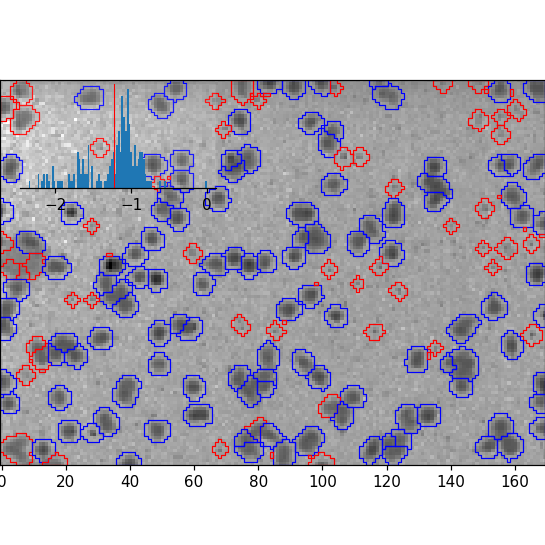

In [346]:
def f(logth):
    axline.set_data([logth]*2,[0,1])
    for i in range(len(lines)):
        lines[i].set_color("r" if np.log10(regions.df.peakValue.iloc[i])<logth else "b")
interactive_plot = interactive(f, logth = widgets.FloatSlider(min=-2,max=0,value=logTh, step = .01))
output = interactive_plot.children[-1]
output.layout.height = '10px'

display(interactive_plot)

# plt.ion()
# fig, ax = plt.subplots(1,1,figsize=(6,6))
fig = plt.figure(figsize=(5,5))
ax = fig.add_axes([0,0,1,1])
image = regions.statImages[regions.mode]
ax.imshow(image, cmap="Greys", norm=LogNorm())
regions.plotEdges(ax=ax, color="C0", image=False, separate=True)
lines = ax.lines
axin = inset_axes(ax, width="90%", height="90%", loc=4,  bbox_to_anchor=(.01, .7, .4, .3),
                      bbox_transform=ax.transAxes,
                     )
# axin.hist(np.log10(image+np.percentile(image,1)).flatten(),100,histtype="step", color="k")
# y,x = np.histogram(np.log10(image+np.percentile(image,1)).flatten(),100)
# x = (x[:-1]+x[1:])/2
# axin.fill_between(x,y, color="navy")
axin.hist(np.log10(regions.df.peakValue),100)
axin.patch.set_alpha( 0.1)
for sp in ["top","left","right"]: axin.spines[sp].set_visible(False)
axin.set_yticks([])
axin.set_ylim(0,)
axline = axin.axvline(logTh,color="r",lw=.7)

In [279]:
l = ax.lines[0]

In [345]:
%%capture
logTh = np.log10(get_sep_th(image.flat,log=True))
logTh = np.round(logTh,2)

In [310]:
axline.set_data?

-1.54

In [ ]:
interactive_plot

In [29]:
# from copy import deepcopy
fracSaturTh = .05
# movieFreq = 2
cmap = plt.cm.Greys
cmap.set_bad("lime")
pd.set_option('display.max_rows', 100)

In [30]:
plt.rcParams["animation.embed_limit"] = 500

<IPython.core.display.Javascript object>


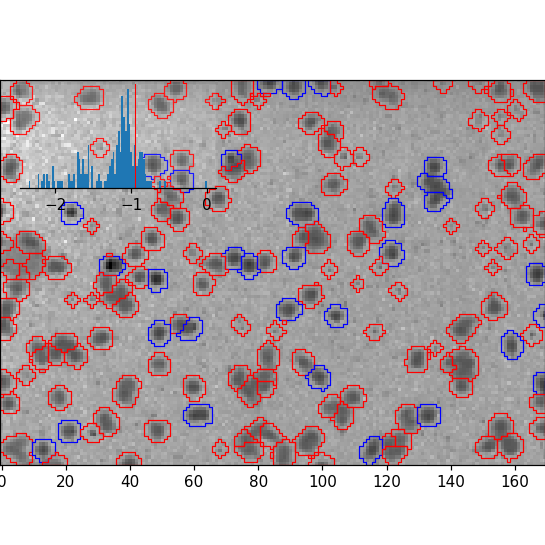

<IPython.core.display.Javascript object>


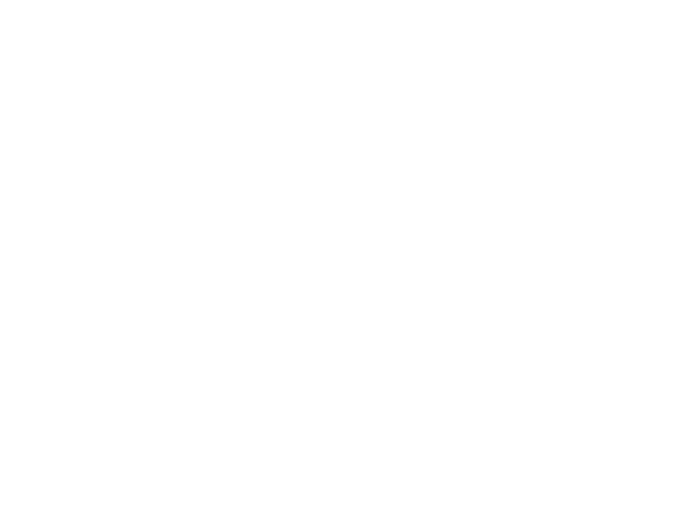

/home/jupyter-srdjan/srdjan_functs/islets/numeric.py:91: RuntimeWarning:

divide by zero encountered in log10



In [338]:
plt.ion()

# fig, ax = plt.subplots(1,1,figsize=(6,6))
fig = plt.figure(figsize=(5,5))
ax = fig.add_axes([0,0,1,1])
image = regions.statImages[regions.mode]
ax.imshow(image, cmap="Greys", norm=LogNorm())
regions.plotEdges(ax=ax, color="C0", image=False, separate=True)
lines = ax.lines
axin = inset_axes(ax, width="90%", height="90%", loc=4,  bbox_to_anchor=(.01, .7, .4, .3),
                      bbox_transform=ax.transAxes,
                     )
# axin.hist(np.log10(image+np.percentile(image,1)).flatten(),100,histtype="step", color="k")
# y,x = np.histogram(np.log10(image+np.percentile(image,1)).flatten(),100)
# x = (x[:-1]+x[1:])/2
# axin.fill_between(x,y, color="navy")
axin.hist(np.log10(regions.df.peakValue),100)
axin.patch.set_alpha( 0.1)
for sp in ["top","left","right"]: axin.spines[sp].set_visible(False)
axin.set_yticks([])
axin.set_ylim(0,)
logTh = np.log10(get_sep_th(image.flat,log=True))
logTh = np.round(logTh,2)
axline = axin.axvline(logTh,color="r",lw=.7)

In [3]:
date, exp, ser = "2020_09_16	experiment68c	all".split("\t")

<IPython.core.display.Javascript object>


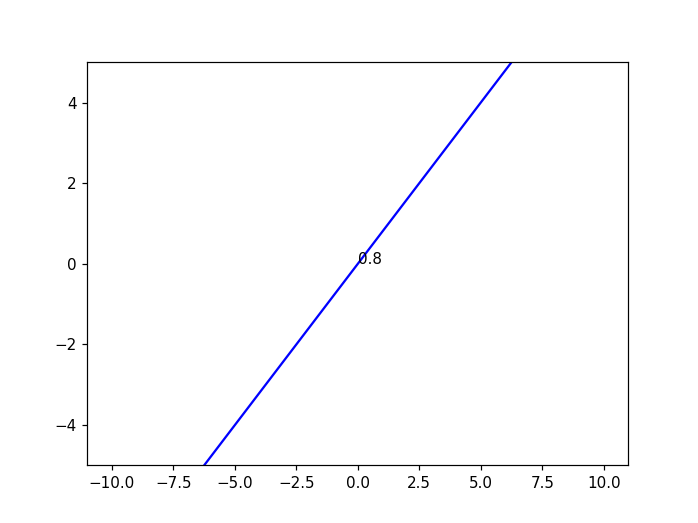

interactive(children=(FloatSlider(value=0.0, description='m', max=2.0, min=-2.0), FloatSlider(value=0.0, descr…

In [277]:
plt.ion()
plt.figure(2)
ax = plt.subplot(111)
text = ax.text(0,0,"")
x = np.linspace(-10, 10, num=1000)
line, = ax.plot(x,[0]*len(x))
ax.set_ylim(-5, 5)
def f(m, b):
    y = m * x + b
    line.set_data(x, y)
    text.set_text(str(m))
    plt.draw()

interactive_plot = interactive(f, m=(-2.0, 2.0), b=(-3, 3, 0.5))
output = interactive_plot.children[-1]
output.layout.height = '150px'
interactive_plot

In [4]:
exp = exp.capitalize()
recFile = f"/data/Sandra/{date.split('_')[0]}/{date}/{exp}.lif"

In [46]:
# recFile, ser = "/data/Sandra/2019/2019_10_15/Experiment38b.lif", "Series042"
recFile, ser = "/data/Sandra/2020/2020_08_05/Experiment63d.lif", "Series004"

In [47]:
# from caiman import load as cload

In [48]:
rec = Recording(recFile)
rec.metadata

,Name,SizeT,SizeX,SizeY,SizeZ,pxSize,pxUnit,bit depth,Frequency,Start time,End time,Duration
0,Image002,1,512,512,1,0.556,µm,uint8,NaN,2020-08-05 15:01:53,NaT,NaT
1,Image003,1,1024,1024,1,0.455,µm,uint8,NaN,2020-08-05 15:05:41,NaT,NaT
2,Series004,32000,256,256,1,1.820,µm,uint8,19.8,2020-08-05 15:08:29,2020-08-05 15:35:28,00:26:59.509611
3,Series005,7744,256,256,1,1.820,µm,uint8,19.8,2020-08-05 15:35:30,2020-08-05 15:42:01,00:06:31.905607
4,Series006,32000,256,256,1,1.820,µm,uint8,19.8,2020-08-05 15:42:03,2020-08-05 16:09:02,00:26:59.574611
5,Series007,5079,256,256,1,1.820,µm,uint8,19.8,2020-08-05 16:09:03,2020-08-05 16:13:20,00:04:17.032607
6,Series008,8705,256,256,1,1.820,µm,uint8,19.8,2020-08-05 16:13:22,2020-08-05 16:20:42,00:07:20.567611
7,Series009,4441,256,256,1,1.820,µm,uint8,19.8,2020-08-05 16:20:44,2020-08-05 16:24:28,00:03:44.769612
8,Series010,3374,256,256,1,1.820,µm,uint8,19.8,2020-08-05 16:24:31,2020-08-05 16:27:21,00:02:50.766612
9,Series011,32000,256,256,1,1.820,µm,uint8,19.8,2020-08-05 16:27:23,2020-08-05 16:54:22,00:26:59.605612


In [8]:
ser = "Series001"

In [49]:
rec.import_series(ser,restrict=(0,10))

In [50]:
metadata = rec.Series[ser]['metadata']

In [51]:
movie = cmovie(rec.Series[ser]['data'],fr = metadata.Frequency)

In [73]:
from caiman import load as cload

In [94]:
os.listdir("/data/Sandra/2019/2019_08_06_Cosmin/")

['MMStack_metadata.txt',
 'MMStack.ome.tif',
 'Slice_2_acinar+beta_cells_down_left.tif']

In [96]:
import json

In [97]:
meta = json.loads(open("/data/Sandra/2019/2019_08_06_Cosmin/MMStack_metadata.txt").read())

In [104]:
from collections import OrderedDict

In [105]:
times = pd.Series(OrderedDict([(k,meta[k]['ElapsedTime-ms']) for k in meta if "Frame" in k]))

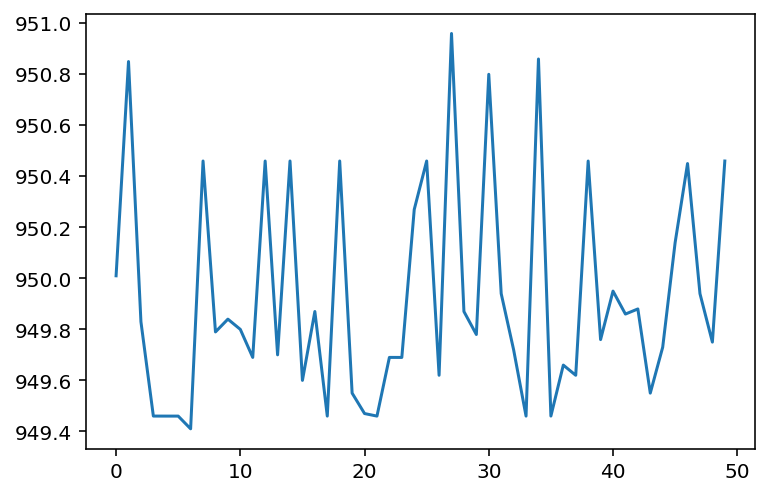

In [112]:
plt.plot(np.diff(times.sort_values())[:100:2])

In [113]:
# meta.keys()

In [114]:
movie = cload("/data/Sandra/2019/2019_08_06_Cosmin/Slice_2_acinar+beta_cells_down_left.tif", fr=1)

(200, 300)

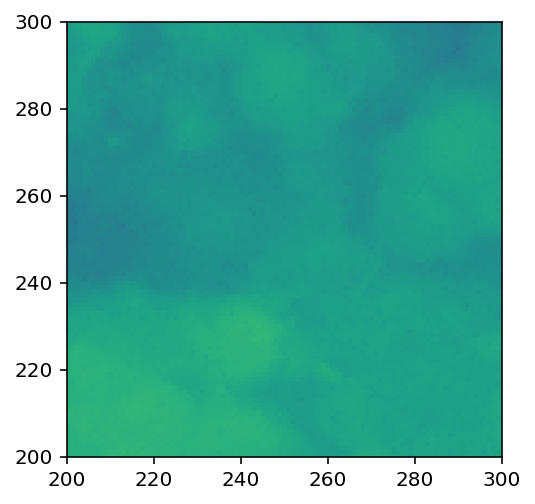

In [88]:
plt.imshow(movie.mean(0), norm=LogNorm())
plt.xlim(200,300)
plt.ylim(200,300)

In [77]:
show_movie(movie.resize(.25,.25))

In [123]:
n = 2**2
regions1 = Regions1(movie.resize(1/n,1/n,1), mode="diff_std", verbose=True, gSig_filt=(3))

Initiating from a movie.
dilating valid pixels by 3
initiating the cralwing dict with 23040 pixels excluded.
entering crawling dict with 23040 pixels excluded.
Crawling the image with 23040 pixels excluded.


In [136]:
Nsatur = (movie==robust_max(movie)).sum(0)

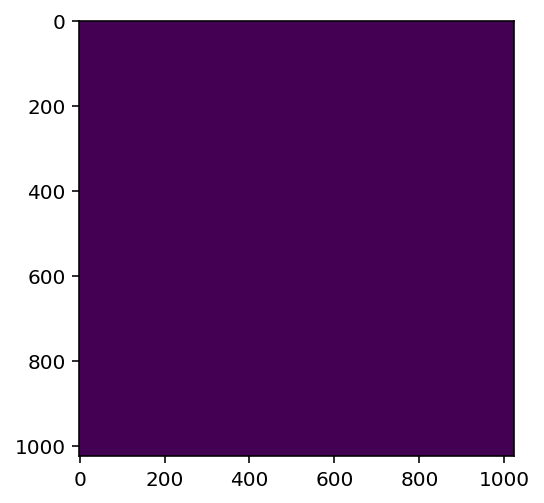

In [137]:
plt.imshow(Nsatur)

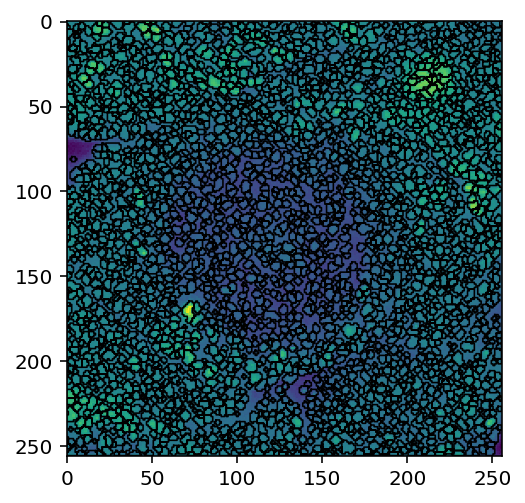

In [124]:
regions1.plotEdges()

In [126]:
# regions1.time# = np.arange(len(regions1.time))

In [127]:
# regions1.calcTraces()

In [128]:
regions1.df.shape

(2633, 10)

initial estimate of the gain is 0.3214103292017983
revised estimate of the gain 0.2314355531350927
revised estimate of the gain 0.2279204987432351
revised estimate of the gain 0.22783997368754275
revised estimate of the gain 0.2278317561315928
revised estimate of the gain 0.2278317561315928


/home/jupyter-srdjan/srdjan_functs/islets/Regions1.py:467: RuntimeWarning:

invalid value encountered in greater



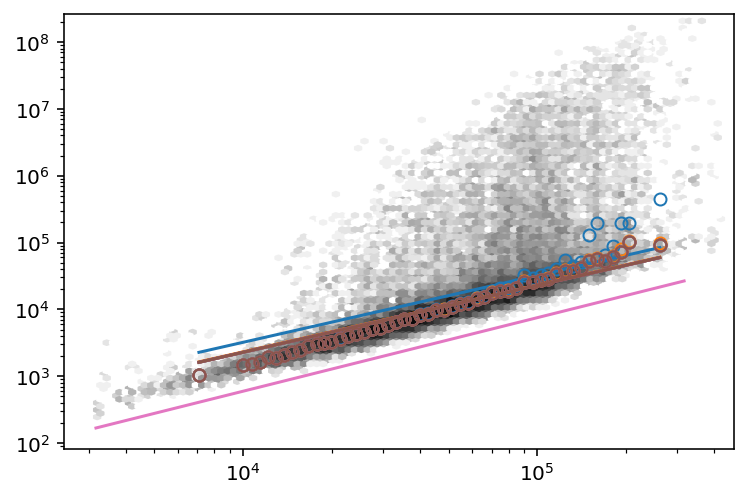

In [162]:
regions1.infer_gain(True,True)
xr = np.logspace(3.5,5.5)
plt.plot(xr, (xr/30)**1.1)

In [169]:
regions1.df["events_10"] = regions1.df.zScore_10.apply(lambda xi: (xi>4).sum()).sort_values(ascending=False)#.index[:30]

In [180]:
regions1.df.events_10.sort_values(ascending=False).index[:10]

Int64Index([371, 547, 311, 341, 137, 1684, 297, 267, 2329, 995], dtype='int64')

In [184]:
# get_sep_th

/opt/tljh/user/envs/physio/lib/python3.7/site-packages/pandas/core/series.py:856: RuntimeWarning:

invalid value encountered in log10

/opt/tljh/user/envs/physio/lib/python3.7/site-packages/numpy/lib/histograms.py:829: RuntimeWarning:

invalid value encountered in greater_equal

/opt/tljh/user/envs/physio/lib/python3.7/site-packages/numpy/lib/histograms.py:830: RuntimeWarning:

invalid value encountered in less_equal



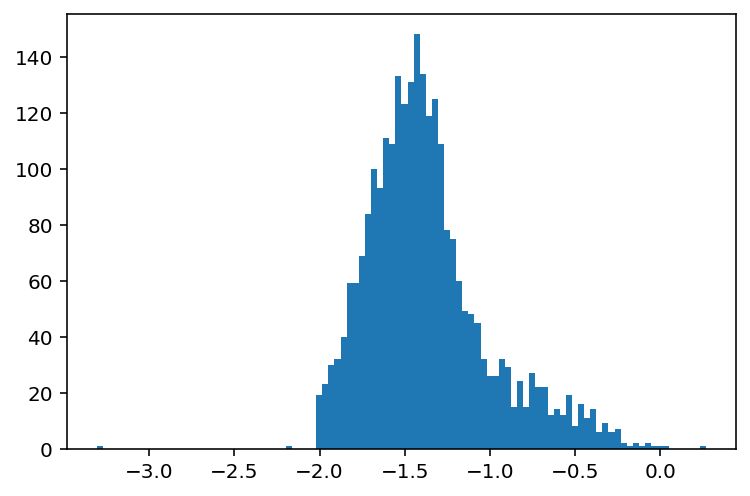

In [185]:
plt.hist(np.log10(regions1.df.peakValue),100);

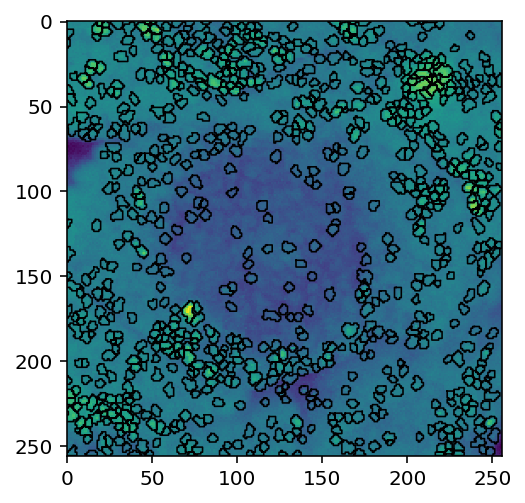

In [187]:
regions1.plotEdges(ix=regions1.df.query("peakValue>.051").index)